In [23]:
import glob


folders = ['original', 'styleclip/old', 'styleclip/sad', 'styleclip/smile', 'styleclip/angry', 'styleclip/curly']
images = {}

for folder in folders:
    images[folder] = sorted(glob.glob(f'{folder}/*.jpg'))

for k, v in images.items():
    print(k, len(v))



original 199
styleclip/old 199
styleclip/sad 189
styleclip/smile 199
styleclip/angry 199
styleclip/curly 199


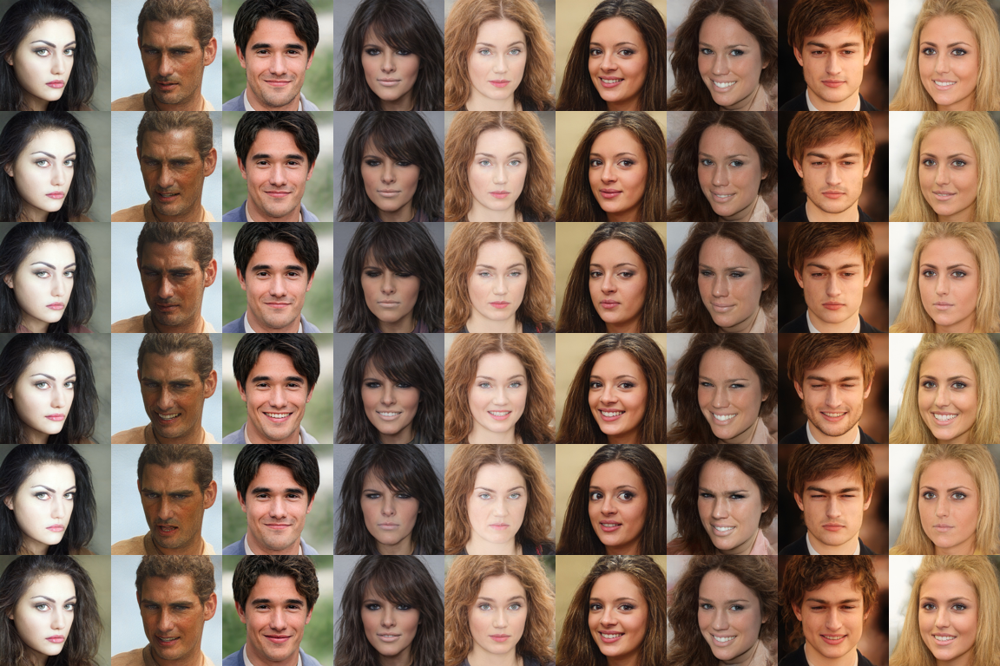

[180, 181, 182, 183, 184, 185, 186, 187, 188]
['original', 'styleclip/old', 'styleclip/sad', 'styleclip/smile', 'styleclip/angry', 'styleclip/curly']


In [24]:
# concatenate several images into one
from PIL import Image


def concat_in_column(image_paths):
    images = [Image.open(img) for img in image_paths]

    # resize all images to 128 * 128
    images = [i.resize((128, 128)) for i in images]

    widths, heights = zip(*(i.size for i in images))

    max_width = max(widths)
    total_height = sum(heights)
    
    new_image = Image.new('RGB', (max_width, total_height))
    
    y_offset = 0
    for image in images:
        new_image.paste(image, (0, y_offset))
        y_offset += image.height
    
    # show the image
    # new_image.show()
    return new_image


def concat_in_row(images):
    widths, heights = zip(*(i.size for i in images))

    total_width = sum(widths)
    max_height = max(heights)

    new_image = Image.new('RGB', (total_width, max_height))

    x_offset = 0
    for image in images:
        new_image.paste(image, (x_offset, 0))
        x_offset += image.width
    
    return new_image


new_images = []
image_ids = []
for i in range(180, 190):
    img_to_concat = []
    for k in folders:
        img_path = f'{k}/{str(i).zfill(5)}.jpg'
        if img_path in images[k]:
            img_to_concat.append(img_path)

    if len(img_to_concat) == 6:
        new_img = concat_in_column(img_to_concat)
        new_images.append(new_img)
        image_ids.append(i)

new_image = concat_in_row(new_images)

new_image.show()
print(image_ids)
print(folders)

# show image with xticks and yticks
# import matplotlib.pyplot as plt

# plt.imshow(new_image)
# plt.xticks(image_ids)
# plt.yticks(folders)
# plt.show()


[4, 8, 21, 37, 39, 70, 72, 78, 97, 98]


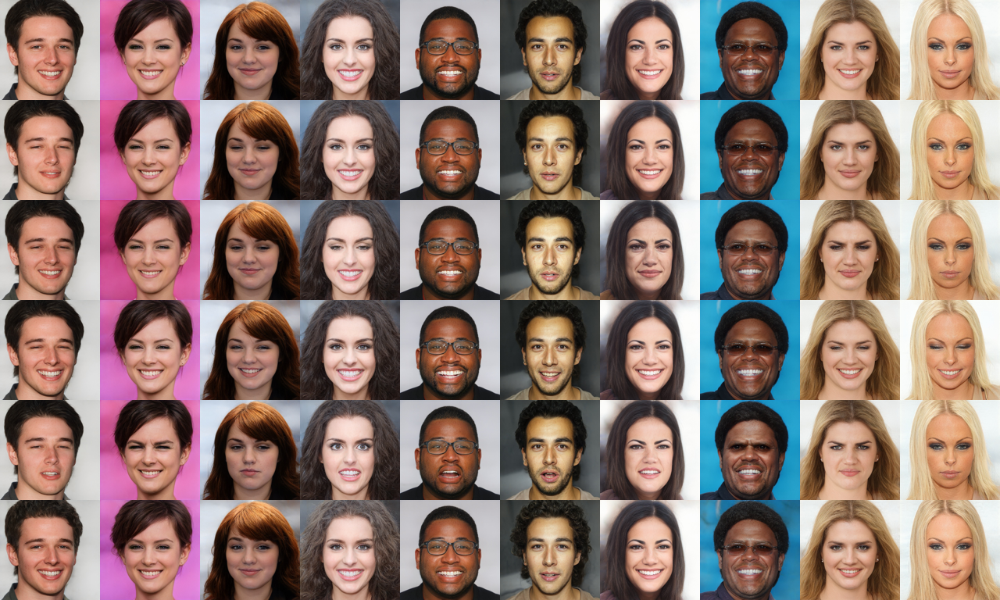

[103, 105, 107, 117, 133, 134, 182, 185, 186]


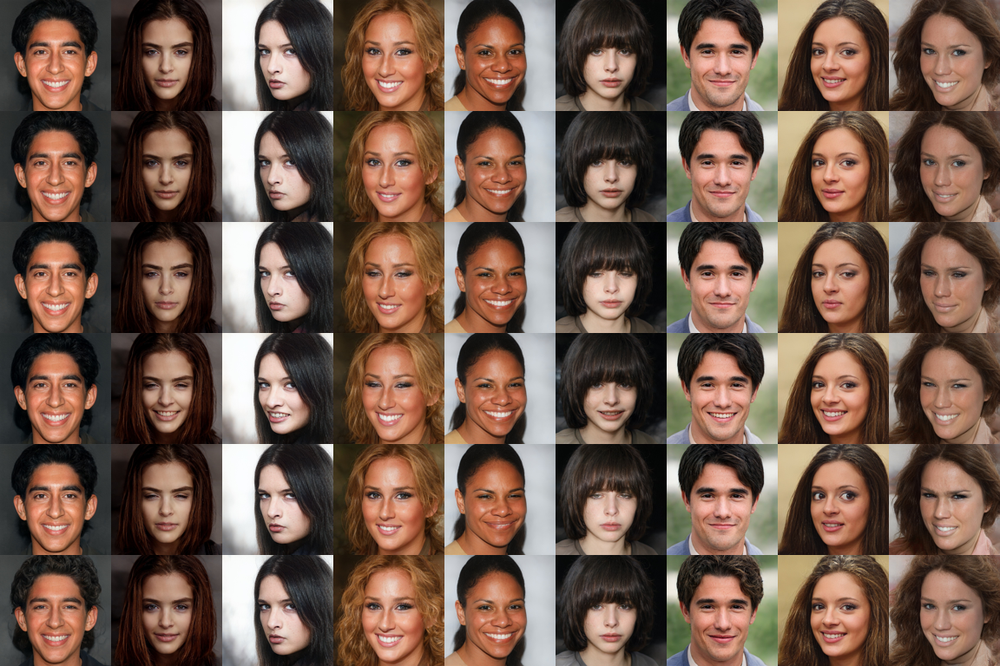

In [25]:
# bad_cases =[4, 8, 21, 34, 37, 39, 46, 60, 61, 70, 72, 78, 81, 87, 91, 92, 97, 98, 101, 102, 103, 105, 107, 109, 117, 102, 133, 134, 157, 182]

bad_cases = [4, 8, 21, 37, 39, 70, 72, 78, 97, 98, 103, 105, 107, 117, 133, 134, 182, 185, 186]

for i in range(int(len(bad_cases) / 10) + 1):
    img_ids = bad_cases[i * 10: (i + 1) * 10]
    img_list = []

    for img_id in img_ids:
        img_to_concat = []
        for k in folders:
            img_path = f'{k}/{str(img_id).zfill(5)}.jpg'
            if img_path in images[k]:
                img_to_concat.append(img_path)
    
            img = concat_in_column(img_to_concat)
        img_list.append(img)
    
    img = concat_in_row(img_list)
    print(img_ids)
    img.show()



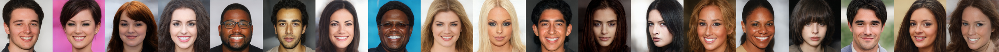

In [26]:
import shutil


ori_img_paths = []

for i in bad_cases:
    img_path = f'original/{str(i).zfill(5)}.jpg'
    tar_img_path = f'examples/original/{str(i).zfill(5)}.jpg'
    shutil.copy(img_path, tar_img_path)

    # img = Image.open(img_path)
    # img.show()
    ori_img_paths.append(img_path)

ori_images = [Image.open(img_path) for img_path in ori_img_paths]
ori_images = [i.resize((128, 128)) for i in ori_images]

ori_image = concat_in_row(ori_images)
# save the image
ori_image.save('examples/original_all.jpg')
ori_image.show()


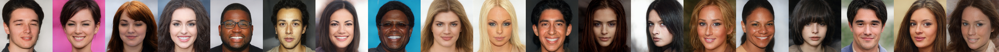

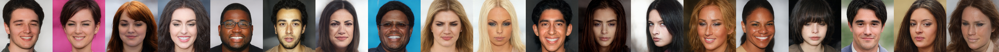

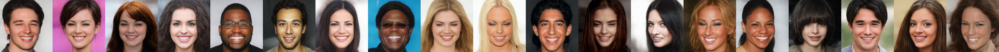

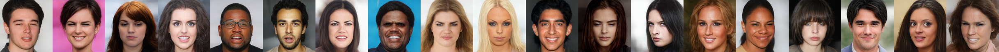

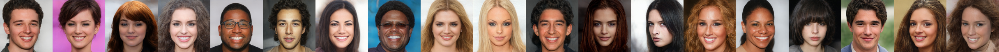

In [32]:
import os
import torch


def concat_examples_in_dir(dir_name):
    for prompt in ['old', 'sad', 'smile', 'angry', 'curly']:
        target_dir = f'examples/{dir_name}/{prompt}'

        if not os.path.exists(target_dir):
            os.makedirs(target_dir)

        opt_img_paths = []
        for i in bad_cases:
            if not os.path.exists(f'{target_dir}/{str(i).zfill(5)}.jpg'):
                img_path = f'{dir_name}/{prompt}/{str(i).zfill(5)}.jpg'
                shutil.copy(img_path, f'{target_dir}/{str(i).zfill(5)}.jpg')
            opt_img_paths.append(f'{target_dir}/{str(i).zfill(5)}.jpg')

        opt_images = [Image.open(img_path) for img_path in opt_img_paths]
        opt_images = [i.resize((128, 128)) for i in opt_images]
        opt_image = concat_in_row(opt_images)
        opt_image.save(f'examples/{dir_name}_{prompt}_all.jpg')
        opt_image.show()

        metric_path = f'{target_dir}/metrics.pt'
        if os.path.exists(metric_path):
            metrics = torch.load(metric_path)
            for k in sorted(metrics.keys()):
                print(k, metrics[k])

concat_examples_in_dir('styleclip')

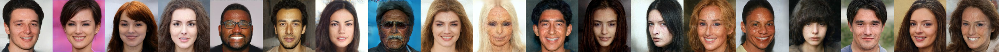

examples/flowgrad/old/00004.jpg {'clip_loss': -0.287109375, 'lpips_score': 0.12325334548950195}
examples/flowgrad/old/00008.jpg {'clip_loss': -0.266357421875, 'lpips_score': 0.031822383403778076}
examples/flowgrad/old/00021.jpg {'clip_loss': -0.266845703125, 'lpips_score': 0.019942138344049454}
examples/flowgrad/old/00037.jpg {'clip_loss': -0.2802734375, 'lpips_score': 0.047402456402778625}
examples/flowgrad/old/00039.jpg {'clip_loss': -0.285888671875, 'lpips_score': 0.38510116934776306}
examples/flowgrad/old/00070.jpg {'clip_loss': -0.29150390625, 'lpips_score': 0.18234270811080933}
examples/flowgrad/old/00072.jpg {'clip_loss': -0.272705078125, 'lpips_score': 0.17001914978027344}
examples/flowgrad/old/00078.jpg {'clip_loss': -0.301513671875, 'lpips_score': 0.19922183454036713}
examples/flowgrad/old/00097.jpg {'clip_loss': -0.279296875, 'lpips_score': 0.06469564139842987}
examples/flowgrad/old/00098.jpg {'clip_loss': -0.31005859375, 'lpips_score': 0.21598763763904572}
examples/flowgrad

/tmp/ipykernel_399332/2215667045.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  metrics = torch.load(metric_path)


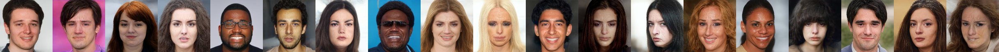

examples/flowgrad/sad/00004.jpg {'clip_loss': -0.26708984375, 'lpips_score': 0.1263468712568283}
examples/flowgrad/sad/00008.jpg {'clip_loss': -0.28466796875, 'lpips_score': 0.10847844183444977}
examples/flowgrad/sad/00021.jpg {'clip_loss': -0.27685546875, 'lpips_score': 0.026912115514278412}
examples/flowgrad/sad/00037.jpg {'clip_loss': -0.27294921875, 'lpips_score': 0.05678129196166992}
examples/flowgrad/sad/00039.jpg {'clip_loss': -0.274169921875, 'lpips_score': 0.392792671918869}
examples/flowgrad/sad/00070.jpg {'clip_loss': -0.281494140625, 'lpips_score': 0.13113321363925934}
examples/flowgrad/sad/00072.jpg {'clip_loss': -0.280029296875, 'lpips_score': 0.21399541199207306}
examples/flowgrad/sad/00078.jpg {'clip_loss': -0.2587890625, 'lpips_score': 0.15149463713169098}
examples/flowgrad/sad/00097.jpg {'clip_loss': -0.277099609375, 'lpips_score': 0.0600573793053627}
examples/flowgrad/sad/00098.jpg {'clip_loss': -0.2958984375, 'lpips_score': 0.1908814162015915}
examples/flowgrad/sad/

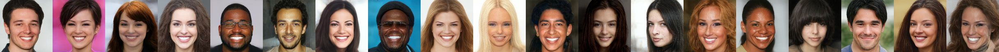

examples/flowgrad/smile/00004.jpg {'clip_loss': -0.278564453125, 'lpips_score': 0.12131305783987045}
examples/flowgrad/smile/00008.jpg {'clip_loss': -0.296630859375, 'lpips_score': 0.03095392882823944}
examples/flowgrad/smile/00021.jpg {'clip_loss': -0.2822265625, 'lpips_score': 0.029964840039610863}
examples/flowgrad/smile/00037.jpg {'clip_loss': -0.2841796875, 'lpips_score': 0.028249602764844894}
examples/flowgrad/smile/00039.jpg {'clip_loss': -0.288818359375, 'lpips_score': 0.3700438439846039}
examples/flowgrad/smile/00070.jpg {'clip_loss': -0.280517578125, 'lpips_score': 0.14299026131629944}
examples/flowgrad/smile/00072.jpg {'clip_loss': -0.27880859375, 'lpips_score': 0.208308145403862}
examples/flowgrad/smile/00078.jpg {'clip_loss': -0.27978515625, 'lpips_score': 0.15365375578403473}
examples/flowgrad/smile/00097.jpg {'clip_loss': -0.2890625, 'lpips_score': 0.06431084871292114}
examples/flowgrad/smile/00098.jpg {'clip_loss': -0.2802734375, 'lpips_score': 0.18154188990592957}
exam

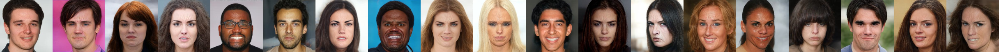

examples/flowgrad/angry/00004.jpg {'clip_loss': -0.2646484375, 'lpips_score': 0.1351986527442932}
examples/flowgrad/angry/00008.jpg {'clip_loss': -0.290771484375, 'lpips_score': 0.11206453293561935}
examples/flowgrad/angry/00021.jpg {'clip_loss': -0.299560546875, 'lpips_score': 0.033952824771404266}
examples/flowgrad/angry/00037.jpg {'clip_loss': -0.285400390625, 'lpips_score': 0.060277968645095825}
examples/flowgrad/angry/00039.jpg {'clip_loss': -0.294189453125, 'lpips_score': 0.37551647424697876}
examples/flowgrad/angry/00070.jpg {'clip_loss': -0.27490234375, 'lpips_score': 0.1441412717103958}
examples/flowgrad/angry/00072.jpg {'clip_loss': -0.29052734375, 'lpips_score': 0.20877262949943542}
examples/flowgrad/angry/00078.jpg {'clip_loss': -0.304443359375, 'lpips_score': 0.20159950852394104}
examples/flowgrad/angry/00097.jpg {'clip_loss': -0.296142578125, 'lpips_score': 0.06581787019968033}
examples/flowgrad/angry/00098.jpg {'clip_loss': -0.303466796875, 'lpips_score': 0.1672916710376

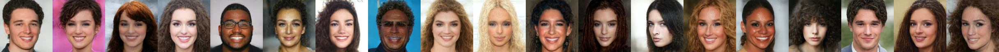

examples/flowgrad/curly/00004.jpg {'clip_loss': -0.333984375, 'lpips_score': 0.14342361688613892}
examples/flowgrad/curly/00008.jpg {'clip_loss': -0.33447265625, 'lpips_score': 0.12498185783624649}
examples/flowgrad/curly/00021.jpg {'clip_loss': -0.3193359375, 'lpips_score': 0.09442038089036942}
examples/flowgrad/curly/00037.jpg {'clip_loss': -0.340087890625, 'lpips_score': 0.09859861433506012}
examples/flowgrad/curly/00039.jpg {'clip_loss': -0.2744140625, 'lpips_score': 0.3854522109031677}
examples/flowgrad/curly/00070.jpg {'clip_loss': -0.3271484375, 'lpips_score': 0.22352902591228485}
examples/flowgrad/curly/00072.jpg {'clip_loss': -0.313720703125, 'lpips_score': 0.2287786602973938}
examples/flowgrad/curly/00078.jpg {'clip_loss': -0.328369140625, 'lpips_score': 0.18448799848556519}
examples/flowgrad/curly/00097.jpg {'clip_loss': -0.341552734375, 'lpips_score': 0.15652300417423248}
examples/flowgrad/curly/00098.jpg {'clip_loss': -0.323974609375, 'lpips_score': 0.2001543939113617}
exa

In [33]:
concat_examples_in_dir('flowgrad')

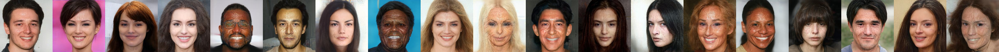

examples/ocfm/old/00004.jpg {'clip_loss': -0.274169921875, 'lpips_score': 0.12844932079315186}
examples/ocfm/old/00008.jpg {'clip_loss': -0.273193359375, 'lpips_score': 0.049527838826179504}
examples/ocfm/old/00021.jpg {'clip_loss': -0.27880859375, 'lpips_score': 0.0666763111948967}
examples/ocfm/old/00037.jpg {'clip_loss': -0.280029296875, 'lpips_score': 0.07148896157741547}
examples/ocfm/old/00039.jpg {'clip_loss': -0.292724609375, 'lpips_score': 0.45141756534576416}
examples/ocfm/old/00070.jpg {'clip_loss': -0.304931640625, 'lpips_score': 0.19267167150974274}
examples/ocfm/old/00072.jpg {'clip_loss': -0.27734375, 'lpips_score': 0.13382554054260254}
examples/ocfm/old/00078.jpg {'clip_loss': -0.31884765625, 'lpips_score': 0.22076570987701416}
examples/ocfm/old/00097.jpg {'clip_loss': -0.283203125, 'lpips_score': 0.09431222826242447}
examples/ocfm/old/00098.jpg {'clip_loss': -0.30322265625, 'lpips_score': 0.23341718316078186}
examples/ocfm/old/00103.jpg {'clip_loss': -0.298828125, 'lpi

/tmp/ipykernel_399332/2215667045.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  metrics = torch.load(metric_path)


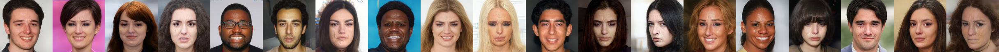

examples/ocfm/sad/00004.jpg {'clip_loss': -0.2744140625, 'lpips_score': 0.13781991600990295}
examples/ocfm/sad/00008.jpg {'clip_loss': -0.27587890625, 'lpips_score': 0.049206070601940155}
examples/ocfm/sad/00021.jpg {'clip_loss': -0.294189453125, 'lpips_score': 0.0347248800098896}
examples/ocfm/sad/00037.jpg {'clip_loss': -0.288818359375, 'lpips_score': 0.08326846361160278}
examples/ocfm/sad/00039.jpg {'clip_loss': -0.265380859375, 'lpips_score': 0.39569801092147827}
examples/ocfm/sad/00070.jpg {'clip_loss': -0.296875, 'lpips_score': 0.15493503212928772}
examples/ocfm/sad/00072.jpg {'clip_loss': -0.29345703125, 'lpips_score': 0.18751700222492218}
examples/ocfm/sad/00078.jpg {'clip_loss': -0.27197265625, 'lpips_score': 0.1870548129081726}
examples/ocfm/sad/00097.jpg {'clip_loss': -0.28759765625, 'lpips_score': 0.0649876818060875}
examples/ocfm/sad/00098.jpg {'clip_loss': -0.30078125, 'lpips_score': 0.14387881755828857}
examples/ocfm/sad/00103.jpg {'clip_loss': -0.271240234375, 'lpips_sc

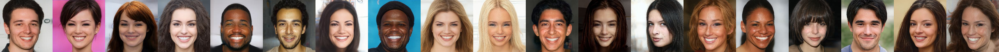

examples/ocfm/smile/00004.jpg {'clip_loss': -0.284423828125, 'lpips_score': 0.1179596409201622}
examples/ocfm/smile/00008.jpg {'clip_loss': -0.2880859375, 'lpips_score': 0.054531291127204895}
examples/ocfm/smile/00021.jpg {'clip_loss': -0.291015625, 'lpips_score': 0.05401920527219772}
examples/ocfm/smile/00037.jpg {'clip_loss': -0.289306640625, 'lpips_score': 0.04122108966112137}
examples/ocfm/smile/00039.jpg {'clip_loss': -0.2841796875, 'lpips_score': 0.36346831917762756}
examples/ocfm/smile/00070.jpg {'clip_loss': -0.283447265625, 'lpips_score': 0.14944453537464142}
examples/ocfm/smile/00072.jpg {'clip_loss': -0.288818359375, 'lpips_score': 0.18977993726730347}
examples/ocfm/smile/00078.jpg {'clip_loss': -0.2998046875, 'lpips_score': 0.20478081703186035}
examples/ocfm/smile/00097.jpg {'clip_loss': -0.293701171875, 'lpips_score': 0.07108449935913086}
examples/ocfm/smile/00098.jpg {'clip_loss': -0.28076171875, 'lpips_score': 0.15218602120876312}
examples/ocfm/smile/00103.jpg {'clip_los

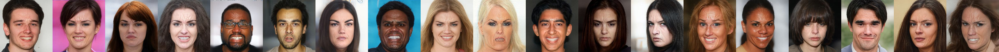

examples/ocfm/angry/00004.jpg {'clip_loss': -0.278564453125, 'lpips_score': 0.13367918133735657}
examples/ocfm/angry/00008.jpg {'clip_loss': -0.29296875, 'lpips_score': 0.07874353229999542}
examples/ocfm/angry/00021.jpg {'clip_loss': -0.306884765625, 'lpips_score': 0.0577673465013504}
examples/ocfm/angry/00037.jpg {'clip_loss': -0.302001953125, 'lpips_score': 0.057116854935884476}
examples/ocfm/angry/00039.jpg {'clip_loss': -0.292236328125, 'lpips_score': 0.39751482009887695}
examples/ocfm/angry/00070.jpg {'clip_loss': -0.29296875, 'lpips_score': 0.12135078012943268}
examples/ocfm/angry/00072.jpg {'clip_loss': -0.29296875, 'lpips_score': 0.2406405508518219}
examples/ocfm/angry/00078.jpg {'clip_loss': -0.3115234375, 'lpips_score': 0.20016726851463318}
examples/ocfm/angry/00097.jpg {'clip_loss': -0.299560546875, 'lpips_score': 0.07849614322185516}
examples/ocfm/angry/00098.jpg {'clip_loss': -0.3037109375, 'lpips_score': 0.2764601707458496}
examples/ocfm/angry/00103.jpg {'clip_loss': -0.2

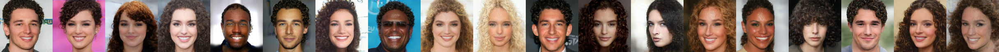

examples/ocfm/curly/00004.jpg {'clip_loss': -0.346923828125, 'lpips_score': 0.2196173220872879}
examples/ocfm/curly/00008.jpg {'clip_loss': -0.34228515625, 'lpips_score': 0.23303627967834473}
examples/ocfm/curly/00021.jpg {'clip_loss': -0.341552734375, 'lpips_score': 0.21068714559078217}
examples/ocfm/curly/00037.jpg {'clip_loss': -0.3525390625, 'lpips_score': 0.2328062355518341}
examples/ocfm/curly/00039.jpg {'clip_loss': -0.2900390625, 'lpips_score': 0.44451895356178284}
examples/ocfm/curly/00070.jpg {'clip_loss': -0.34033203125, 'lpips_score': 0.1932630091905594}
examples/ocfm/curly/00072.jpg {'clip_loss': -0.3466796875, 'lpips_score': 0.339974969625473}
examples/ocfm/curly/00078.jpg {'clip_loss': -0.321533203125, 'lpips_score': 0.20059171319007874}
examples/ocfm/curly/00097.jpg {'clip_loss': -0.355712890625, 'lpips_score': 0.2730194926261902}
examples/ocfm/curly/00098.jpg {'clip_loss': -0.331298828125, 'lpips_score': 0.3137521743774414}
examples/ocfm/curly/00103.jpg {'clip_loss': -

In [34]:
concat_examples_in_dir('ocfm')
